# Partie 1(a). Création des images binaire et d’intensités (image en niveaux de gris)
## Exo 1 : image binaire
Créer une image qui est un carré blanc de taille 50x50 pixels au centre d’un fond noir de taille 100x100 pixels (en utilisant les commandes de création des matrices, zeros(), ones(), etc) et afficher cette image (utiliser image of 100x100 pixels de cette fonction).

![image1](Images/Exemples/image1.png)

Programme paramétré : rendre en paramètres la taille du fond, la taille de l’objet, la position du carré afin de changer leurs valeurs sans changer la structure du programme.


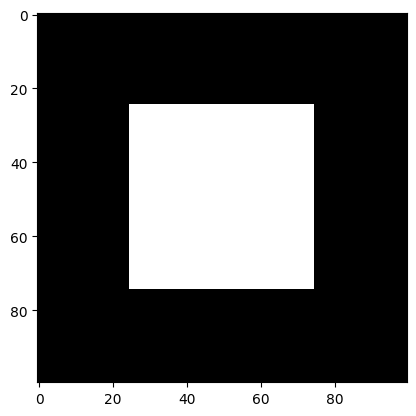

In [153]:
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

background = np.zeros((100, 100, 3), dtype=np.uint8)

start_x = (100 - 50) // 2
start_y = (100 - 50) // 2

background[start_x:start_x + 50, start_y:start_y + 50] = 255

img = Image.fromarray(background)

plt.imshow(background, cmap='gray')

## Exo 2
Écrire un programme pour créer une image binaire alternée de dimension NxN (avec
N=100), (les pixels dont le numéro est impair ont la valeur 0, pair la valeur 1).

![image2](Images/Exemples/image2.png)

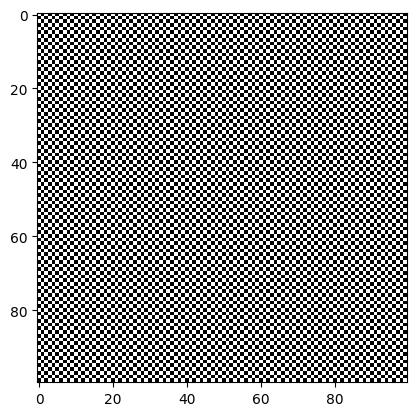

In [7]:
width, height = 100, 100

# Create a black background
checkerboard = np.zeros((height, width, 3), dtype=np.uint8)

# Size of each square in the checkerboard
square_size = 1

# Create the checkerboard pattern
for i in range(0, height, square_size):
    for j in range(0, width, square_size):
        # If the sum of row and column indices is even, make the square white
        if ((i // square_size) + (j // square_size)) % 2 == 0:
            checkerboard[i:i + square_size, j:j + square_size] = 255

plt.imshow(checkerboard, cmap='gray')

## Exo 3
Écrire le programme pour créer une image, de dimension NxN (avec N=50, puis N=100), de niveaux de gris progressifs en fonction de la position de pixel (la valeur de chaque pixel dépend de la position de ce pixel dans la matrice NxN).

Attention à la normalisation : les niveaux de gris doivent être entre [0, 1] ou [0, 255]

![image3](Images/Exemples/image3.png)

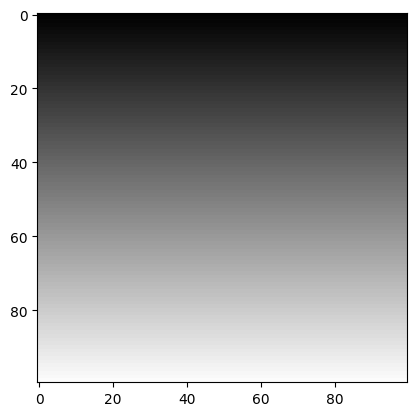

In [8]:
gradient = np.zeros((height, width, 3), dtype=np.uint8)

for i in range(0, height):
    for j in range(0, width):
        gradient[i, j] = i / height * 255.0

plt.imshow(gradient, cmap='gray')

# Partie 1(b). Image couleur

Rappel du dosage des couleurs (mesures psycho-visuelles) :
- Rouge (r=1, g=0, b=0) ;
- Vert (r=0, g=1, b=0) ;
- Gris (r=g=b=0.5) ;
- Jaune (r=1, g=1, b=0) ;
- Violet (r=1, g=0, b=1) ;
- Blanc (r=1, g=1, b=1) ;
- Vert sombre (r=0, g=0.5, b=0) ;
- Bleu-vert (r=0, g=0.6, b=1) ;
- Bleu (r=0, g=0, b=1) ;
- Violet (r=1, g=0, b=1) ;
- Orange (r=1, g=0.5, b=0) ;

## Éxo 4
Création des images couleurs par deux méthodes : Représentation RGB et représentation indexée

![image4](Images/Exemples/image4.png) ![image5](Images/Exemples/image5.png)

|           |           |
|-----------|-----------|
| Gris      | Bleu-vert |Rouge|
| Bleu-vert | Rouge     |Bleu-vert|
| Rouge     | Bleu-vert |Gris|

et

|       |       |
|-------|-------|
| Gris  | Vert  |Rouge|
| Vert  | Rouge |Vert|
| Rouge | Vert  |Gris|

(Rappel sur la représentation **RGB** : créer trois matrices de couleurs suivantes :
 ```
 R=[…];
 G=[…];
 B=[…];
 ```
Puis les concaténer dans une matrice à trois dimensions I par :
```
I(:,:,1) = R;
I(:,:,2) = G;
I(:,:,3) = B;
```
)

(Rappel sur la Représentation indexée :
créer :
- une table de couleurs appelée map=[…] qui est une matrice nx3 (où n est le nombre de
couleurs dans l'image) et
- une matrice de l'image I=[….] qui contient les nombres entiers compris entre 1 et n, chaque
entier joue le rôle d'un index relatif à la table de couleurs, et
- afficher l’image par imshow(I,map).
map=[….] ;
I=[….] ;
imshow(I, map) ;
)

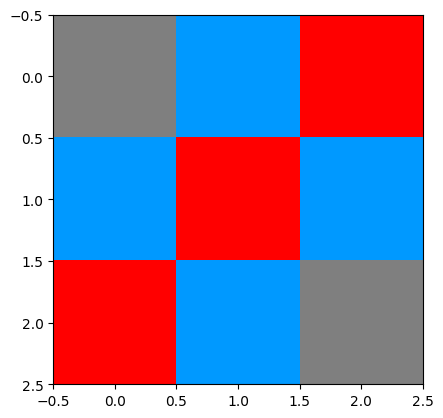

In [14]:
# Représentation RGB

r = np.array([[0.5, 0, 1.0], [0, 1.0, 0], [1.0, 0, 0.5]])
g = np.array([[0.5, 0.6, 0], [0.6, 0, 0.6], [0, 0.6, 0.5]])
b = np.array([[0.5, 1.0, 0], [1.0, 0, 1.0], [0, 1.0, 0.5]])

image_color_rgb = np.dstack((r, g, b))
plt.imshow(image_color_rgb)

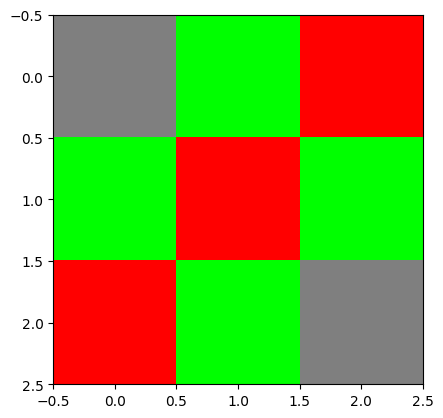

In [19]:
# Représentation indexée
import matplotlib.colors as colors

indexes = np.array([[0.5, 0.5, 0.5], [0, 1.0, 0], [1.0, 0, 0]])
image_indexed = np.array([[0, 1, 2], [1, 2, 1], [2, 1, 0]])
custom_cmap = colors.ListedColormap(indexes)
plt.imshow(image_indexed, cmap=custom_cmap, interpolation="none")

# Partie 2

Rappel sur l’histogramme :
Notations :
- H(n) : histogramme de l’intensité (n) est le nombre de pixels ayant la même intensité (n)
- E(y, x) : l’intensité du pixel à la position (y, x) de l’image d’entrée E
- Emax : l’intensité maximale de l’image d’entrée
- Emin : l’intensité minimale de l’image d’entrée
- S(y, x) : l’intensité du pixel à la position (y, x) de l’image de sortie S
- Hc(k) : histogramme cumulé de l’intensité (k) est la somme des histogrammes des intensités inférieures ou égales à k (n = 0 ÷ k)
- N =NL x NC : nombre de pixels de l’image
- Hcn(k) : histogramme cumulé normalisé de l’intensité (k)
- k’ est l’intensité après l’opération d’égalisation de l’intensité originale k

Formule d’étirement :
*S(y, x) = 255 / (Emax - Emin) × (E(y, x) - Emin*

Histogramme cumulé :
*Hc(k) = for i in range(0, k): H(n)*

Histogramme cumulé normalisé :
*Hcn(k) = 1/n × Hc(k)*

Formule d’égalisation discrète :
*k' = t(k) = 256 / n × Hc(k) = 256 × Hcn(k)*

**Travaux à effectuer :**
Tracer une courbe en testant trois fonctions différentes : plot(x,y), stem(), bar().

1) Pour l’image de test dans le fichier ‘histo_imageTest_entree_3D.png’ se trouvant dans le répertoire «Images» : écrire les algorithmes/programmes afin de
    - Calculer l’histogramme de l’image originale et l’histogramme cumulé, puis les afficher.
    - Modifier les intensités des pixels de l’image originale afin d’obtenir une nouvelle image dont l’histogramme est **étiré**, puis afficher l’image étirée, son histogramme et histogramme cumulé.
    - Modifier les intensités des pixels de l’image originale afin d’obtenir une nouvelle image dont l’histogramme est **égalisé**, puis afficher l’image égalisée, son histogramme et histogramme cumulé.

    ⇒ Comparer les trois images originale, étirée et égalisée.
    ⇒ Commenter les histogrammes obtenus et expliquer les.

Les résultats sont présentés en colonnes (l’image à gauche, son histogramme et son histogramme cumulé à droite) avec les intitulés des images et les valeurs des axes.

Exemples :
**Histogrammes original, étiré, égalisé et cumulé**
![image6](Images/Exemples/image6.png)

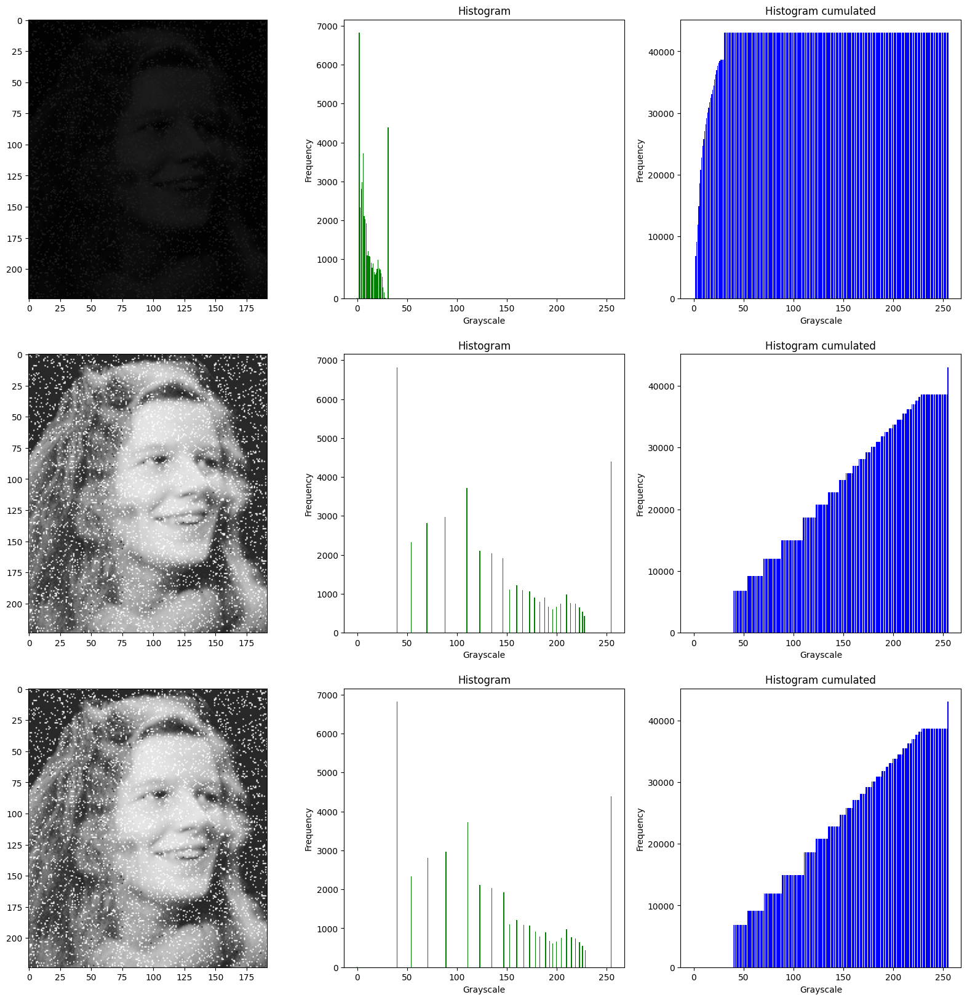

In [52]:
import cv2

image = cv2.cvtColor(cv2.imread("Images/histo_imageTest_entree_3D.png"), cv2.COLOR_BGR2RGB)

histogram = np.zeros(256)
for i in range(image.shape[0]):
    for j in range(image.shape[1]):
        histogram[image[i, j]] += 1

cumulated_histogram = np.zeros(256)
for i in range(256):
    if i != 0:
        cumulated_histogram[i] = cumulated_histogram[i - 1] + histogram[i]
    else:
        cumulated_histogram[i] = histogram[i]

_, axes = plt.subplots(3, 3, figsize=(20, 20))
axes[0, 0].imshow(image)
axes[0, 1].bar(x=list(range(256)), height=histogram, color="g")
axes[0, 2].bar(x=list(range(256)), height=cumulated_histogram, color="b")
axes[0, 1].set_title("Histogram")
axes[0, 2].set_title("Histogram cumulated")
axes[0, 2].set_xlabel("Grayscale")
axes[0, 2].set_ylabel("Frequency")
axes[0, 1].set_xlabel("Grayscale")
axes[0, 1].set_ylabel("Frequency")

image_extended = image.copy()
hr = cumulated_histogram / np.sum(histogram)
for i in range(image.shape[0]):
    for j in range(image.shape[1]):
        image_extended[i, j] = hr[image[i, j]] * 255

histogram_extended = np.zeros(256)
for i in range(image_extended.shape[0]):
    for j in range(image_extended.shape[1]):
        histogram_extended[image_extended[i, j]] += 1

cumulated_histogram_extended = np.zeros(256)
for i in range(256):
    if i != 0:
        cumulated_histogram_extended[i] = cumulated_histogram_extended[i - 1] + histogram_extended[i]
    else:
        cumulated_histogram_extended[i] = histogram_extended[i]

axes[1, 0].imshow(image_extended)
axes[1, 1].bar(x=list(range(256)), height=histogram_extended, color="g")
axes[1, 2].bar(x=list(range(256)), height=cumulated_histogram_extended, color="b")
axes[1, 1].set_title("Histogram")
axes[1, 2].set_title("Histogram cumulated")
axes[1, 2].set_xlabel("Grayscale")
axes[1, 2].set_ylabel("Frequency")
axes[1, 1].set_xlabel("Grayscale")
axes[1, 1].set_ylabel("Frequency")

# Calculate probability distribution
total_pixels = image_extended.shape[0] * image_extended.shape[1]
probability_distribution = histogram_extended / total_pixels

# Calculate cumulative distribution function (CDF)
cumulative_distribution = np.zeros(256)
cumulative_distribution[0] = probability_distribution[0]
for i in range(1, 256):
    cumulative_distribution[i] = cumulative_distribution[i - 1] + probability_distribution[i]

# Create lookup table for equalization
# Formula: h(v) = round((L-1) * CDF(v))
# where L is the number of intensity levels (256 for 8-bit image)
lookup_table = np.round(255 * cumulative_distribution).astype(np.uint8)

# Apply lookup table to the channel
image_equalized = np.zeros_like(image_extended)
for i in range(image_extended.shape[0]):
    for j in range(image_extended.shape[1]):
        image_equalized[i, j] = lookup_table[image_extended[i, j]]

histogram_equalized = np.zeros(256)
for i in range(image_equalized.shape[0]):
    for j in range(image_equalized.shape[1]):
        histogram_equalized[image_equalized[i, j]] += 1

cumulated_histogram_equalized = np.zeros(256)
for i in range(256):
    if i != 0:
        cumulated_histogram_equalized[i] = cumulated_histogram_equalized[i - 1] + histogram_equalized[i]
    else:
        cumulated_histogram_equalized[i] = histogram_equalized[i]

axes[2, 0].imshow(image_equalized)
axes[2, 1].bar(x=list(range(256)), height=histogram_equalized, color="g")
axes[2, 2].bar(x=list(range(256)), height=cumulated_histogram_equalized, color="b")
axes[2, 1].set_title("Histogram")
axes[2, 2].set_title("Histogram cumulated")
axes[2, 2].set_xlabel("Grayscale")
axes[2, 2].set_ylabel("Frequency")
axes[2, 1].set_xlabel("Grayscale")
axes[2, 1].set_ylabel("Frequency")

plt.show()


2) Question avancée : Écrire le programme qui calcule l’histogramme d’une image couleur.
**Exemple ‘perroquet_couleur.png’ :**

![image7](Images/Exemples/image7.png)

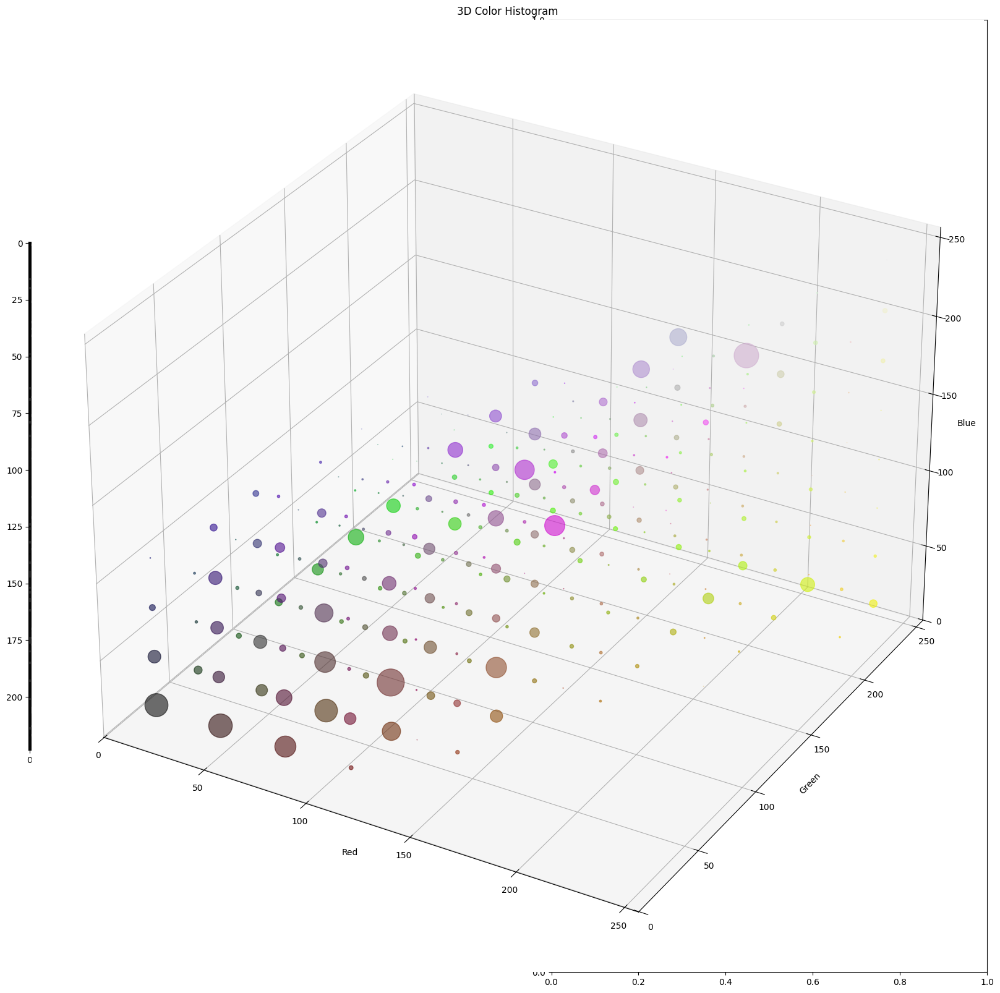

In [66]:
image_color = cv2.cvtColor(cv2.imread("Images/perroquet_couleur.png"), cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(20, 20))

axes[0].imshow(image)
# Calculate 3D histogram
hist = cv2.calcHist([image_color], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])

# Normalize the histogram
hist = cv2.normalize(hist, hist, 0, 1, cv2.NORM_MINMAX)

# Create a figure
ax = fig.add_subplot(111, projection='3d')

# Create coordinate arrays for visualization
bin_size = 256 // 8
r_edges = np.arange(0, 256, bin_size)
g_edges = np.arange(0, 256, bin_size)
b_edges = np.arange(0, 256, bin_size)

# Use the center of each bin for coordinates
r_centers = r_edges + bin_size / 2
g_centers = g_edges + bin_size / 2
b_centers = b_edges + bin_size / 2

# Create meshgrid
r, g, b = np.meshgrid(r_centers, g_centers, b_centers)

# Scale the sizes for better visualization
sizes = hist.flatten() * 1000

# Filter out very small values to reduce clutter
mask = sizes > 0.01

# Plot the histogram as a scatter plot
scatter = ax.scatter(
    r.flatten()[mask],
    g.flatten()[mask],
    b.flatten()[mask],
    s=sizes[mask],
    c=np.column_stack([
        r.flatten()[mask] / 255,
        g.flatten()[mask] / 255,
        b.flatten()[mask] / 255
    ]),
    alpha=0.6
)

# Set labels and title
ax.set_xlabel('Red')
ax.set_ylabel('Green')
ax.set_zlabel('Blue')
ax.set_title('3D Color Histogram')

plt.show()

# Partie 4 : Débruitage

**Rappel sur le filtrage :**
1. Filtre médian :
    Ce filtre affecte à un pixel la valeur médiane des intensités dans son voisinage. Autrement dit, le filtre médian retient une valeur d'intensité telle que dans le voisinage, il y ait d'autant d'intensités supérieures que d'intensités inférieures à cette valeur.

    Exemple : un voisinage de 3x3 pixels dans une image :

    ```
    image_originale = [[7, 5, 3],
                      [4, 2, 7],
                      [6, 5, 1]]
    ```
    Le filtre médian range par ordre croissant les intensités du voisinage :

    1 2 3 4 **5** 5 6 7 7

    Il affecte au pixel central (qui valait 2) l'intensité qui se trouve au milieu du rangement ci-dessus, c'est-à-dire **5**, donc le résultat est :
    ```
    image_mediane   = [[7, 5, 3],
                      [4, 5, 7],
                      [6, 5, 1]]
    ```

2. Filtre moyenneur :

    Ce filtre remplace le niveau de gris du pixel central par la moyenne des niveaux de gris des pixels autour du pixel central. Pour cela on peut utiliser un masque h rectangulaire du type (8-connexe) et convoluer l’image originale avec le masque :

    ```
           (1 1 1)
    h = 1/9(1 1 1)
           (1 1 1)
    ```

    Le résultat est :

    ```
                (7 5 3)
    Imoyenne =  (4 4 7)
                (7 5 1)
    ```

    La taille du masque est un paramètre variable. Plus la taille du masque est grande plus l'effet du filtrage est fort. Exemple : la taille du masque rectangulaire : 3x3, 5x5, 9x9.

    Afin de conserver la dynamique des niveaux de gris, il faut que la somme des éléments / coefficients du masque soit égale à 1.

    Pour que le filtrage soit isotopique (même effet dans toutes les directions), le voisinage considéré devra avoir une forme circulaire (filtre circulaire, filtre conique).

    L'inconvénient du filtre moyenneur est l'introduction de flou, les contours sont donc dégradés.

3. Filtre gaussien (exemple d'un filtre gaussien de taille L = 5 × 5, écart type σ = 1.4)

    h (x, y) = (1 / 2πσ²)e^(-(x²+y²)/2σ²)


**Travaux à effectuer : Débruitage par différents filtres** (médian, moyenneur, gaussien)

**Exo.1 :** Débruitage par le filtre médian de l'image suivante déjà traitée dans la séance d'histogramme :

![image8](Images/Exemples/image8.png)

![image9](Images/Exemples/image9.png)



In [90]:
def median_filter(image):
    image_filter_median = image.copy()
    for i in range(2, image.shape[0] - 1):
        for j in range(2, image.shape[1] - 1):
            area = image[i - 2:i + 2, j - 2:j + 2]
            median = np.median(area)
            image_filter_median[i, j] = median
    return image_filter_median

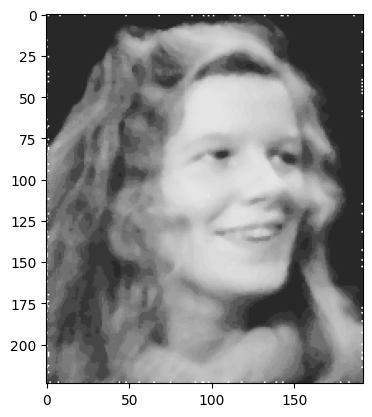

In [76]:
plt.imshow(median_filter(image_equalized))

**Exo.2**

1) Lire le fichier d’image (l’image de test pour cette séance est ‘lena.gif’, ou 'circuit.tif' ou ‘cameraman.tif’).
2) Ajouter à l'image originale le bruit de type gaussien de moyenne nulle et de variance 0.04 (4% de la valeur max), et de type ‘salt & pepper’. (fonction imnoise(I, 'gaussian/salt & pepper', mean, var) ). Afficher les deux images ainsi bruitées.
3) Appliquer sur les deux images bruitées un filtre moyenneur rectangulaire de taille 3x3, afficher et commenter les résultats obtenus.
4) Appliquer sur les deux images bruitées le «filtre médian », afficher et commenter les résultats obtenus.
5) Comparer 3) et 4).

![image10](Images/Exemples/image10.png)

6) Commenter sur l’atténuation du bruit et la qualité (ou la détérioration des détails) en fonction de la largeur du filtre moyenneur, puis le choix de la largeur adaptée ou optimale

![image12](Images/Exemples/image12.png)

![image11](Images/Exemples/image11.png)

7) Appliquer un filtre gaussien de votre choix (sur la taille du filtre et sur les paramètres
du gaussien) et comparer les résultats avec ceux d’autres filtres.

In [94]:
def mean_filter(image, kernel_size):

    kernel = np.ones((kernel_size, kernel_size), np.float32) / kernel_size ** 2
    filtered_image = cv2.filter2D(image, ddepth=-1, kernel=kernel)
    return filtered_image



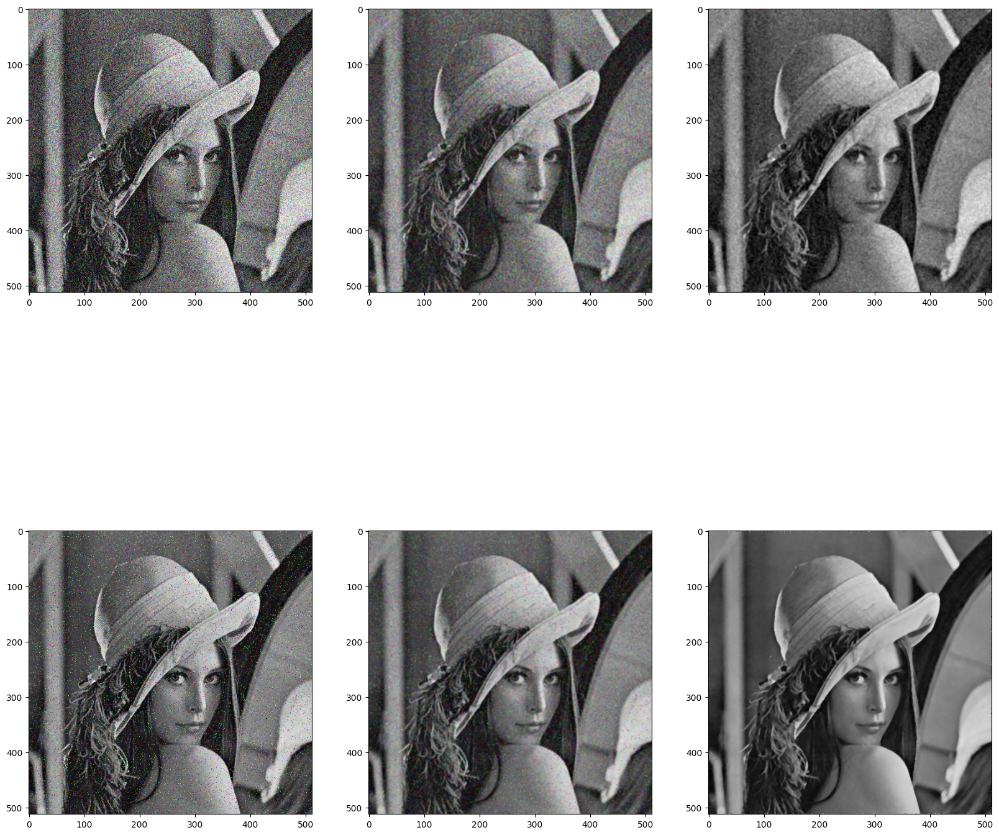

In [91]:
from skimage.util import random_noise

image_lena = cv2.imread("Images/lena.jpg")
noisy_lena_gaussian = random_noise(image_lena, mode='gaussian', var=0.04)
noisy_lena_salt_n_pepper = random_noise(image_lena, mode='s&p')
lena_gaussian_mean = mean_filter(noisy_lena_gaussian, 3)
lena_gaussian_median = median_filter(noisy_lena_gaussian)
lena_salt_n_pepper_mean = mean_filter(noisy_lena_salt_n_pepper, 3)
lena_salt_n_pepper_median = median_filter(noisy_lena_salt_n_pepper)

_, axes = plt.subplots(2, 3, figsize=(20, 20))
axes[0, 0].imshow(noisy_lena_gaussian)
axes[1, 0].imshow(noisy_lena_salt_n_pepper)
axes[0, 1].imshow(lena_gaussian_mean)
axes[0, 2].imshow(lena_gaussian_median)
axes[1, 1].imshow(lena_salt_n_pepper_mean)
axes[1, 2].imshow(lena_salt_n_pepper_median)


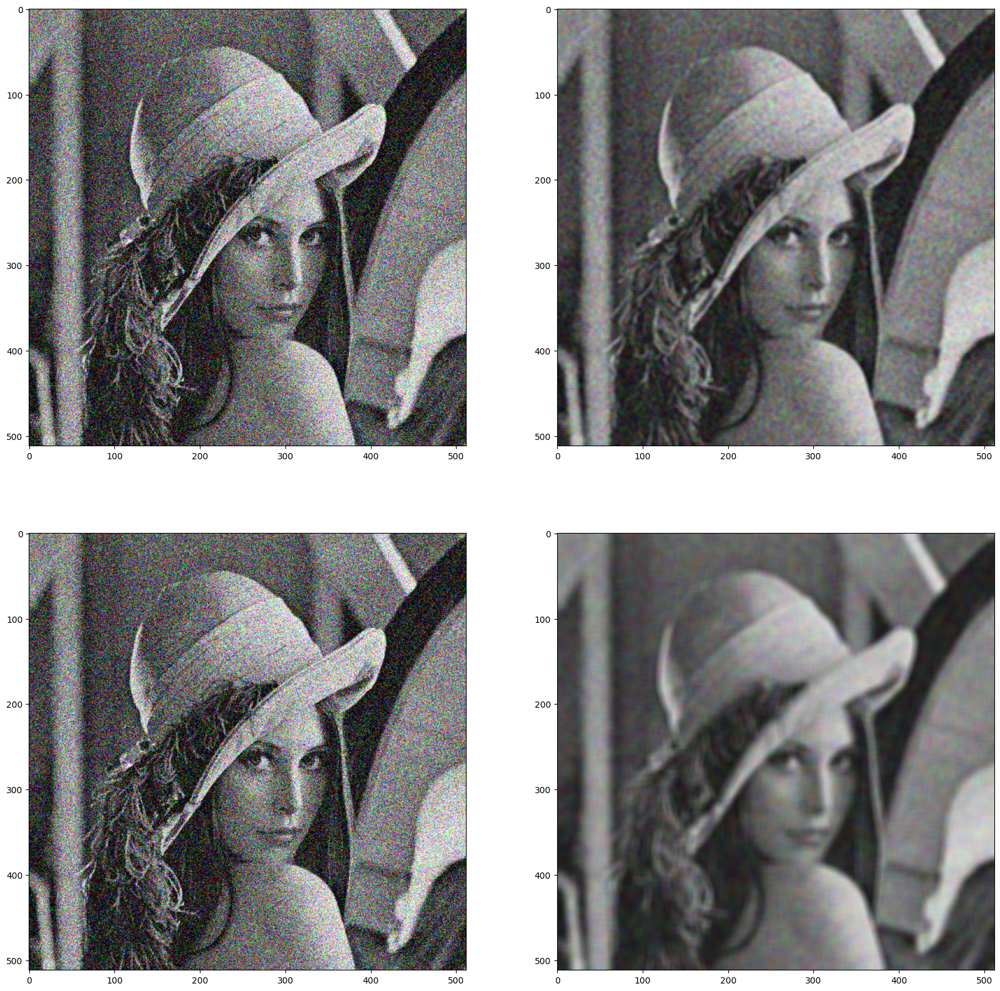

In [95]:
lena_mean_5 = mean_filter(noisy_lena_gaussian, 5)
lena_mean_10 = mean_filter(noisy_lena_gaussian, 10)

_, axes = plt.subplots(2, 2, figsize=(20, 20))
axes[0, 0].imshow(noisy_lena_gaussian)
axes[0, 1].imshow(lena_mean_5)
axes[1, 0].imshow(noisy_lena_gaussian)
axes[1, 1].imshow(lena_mean_10)

In [143]:
def gaussian_filter(image, kernel_size, sigma):
    kernel = np.zeros((kernel_size, kernel_size), np.float32)
    for i in range(kernel_size):
        for j in range(kernel_size):
            kernel[i, j] = (1 / (2 * np.pi * sigma ** 2)) * np.exp(-(i ** 2 + j ** 2) / (2 * sigma ** 2))

    kernel = kernel / np.sum(kernel)
    filtered_image = cv2.filter2D(image, ddepth=-1, kernel=kernel)
    return filtered_image

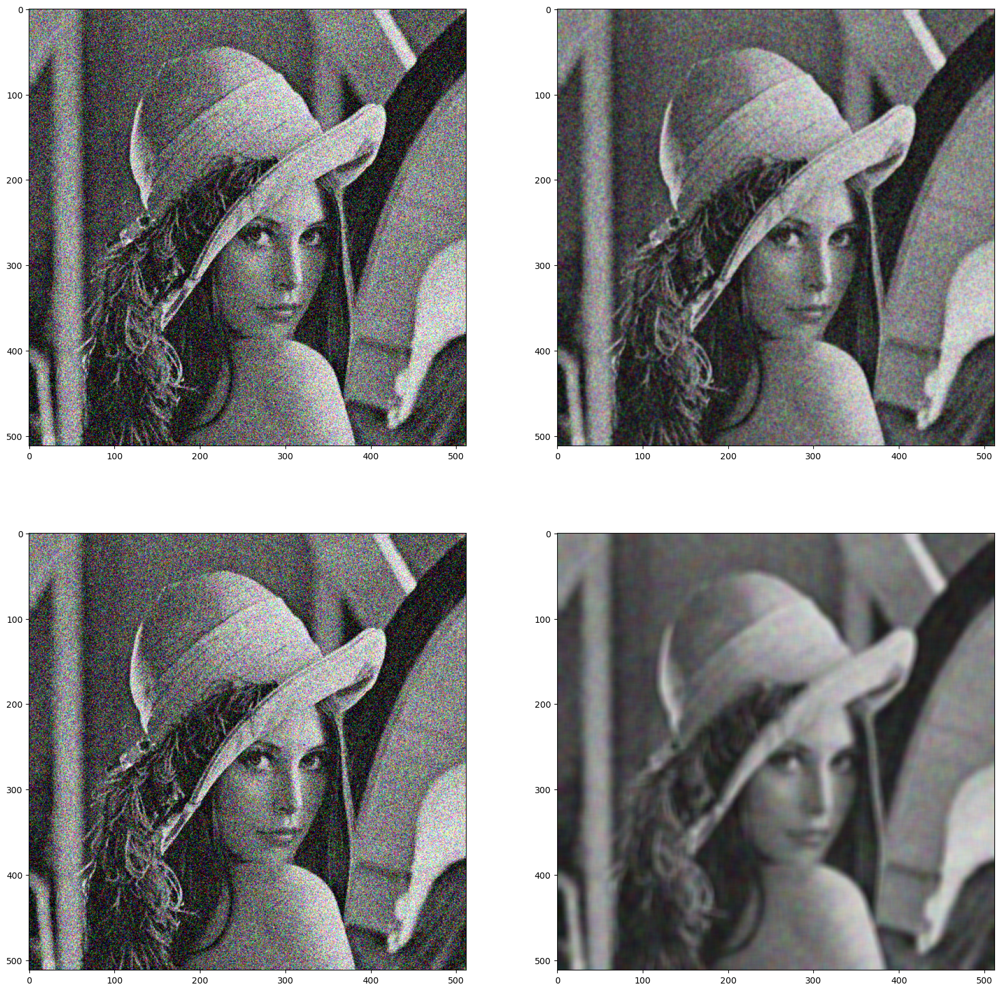

In [145]:
lena_gaussian_5 = gaussian_filter(noisy_lena_gaussian, 5, 1.4)
lena_gaussian_10 = gaussian_filter(noisy_lena_gaussian, 10, 1.4)

_, axes = plt.subplots(2, 2, figsize=(20, 20))
axes[0, 0].imshow(noisy_lena_gaussian)
axes[0, 1].imshow(lena_gaussian_5)
axes[1, 0].imshow(noisy_lena_gaussian)
axes[1, 1].imshow(lena_gaussian_10)

# Partie 5 : Analyse des caractéristiques à l’aide de filtrage

**Exercice 1 :** détection de contours, par le filtre Prewitt ou Sobel, du carré blanc (50x50) sur un fond noir (100x100), puis « cameraman.tif ». Résultats attendus :

![image13](Images/Exemples/image13.png)

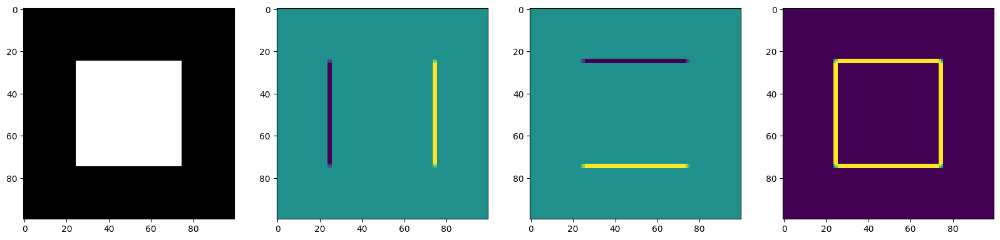

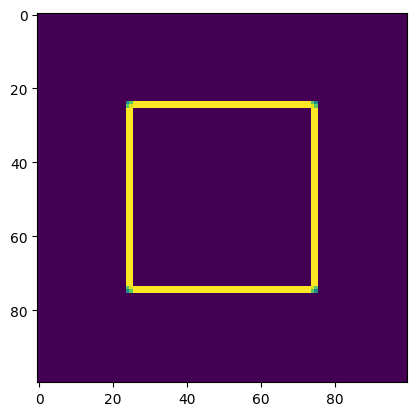

In [182]:
from scipy import ndimage
def prewitt_filter(image):
    hx = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
    hy = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

    _, axes = plt.subplots(1, 4, figsize=(20, 20))
    axes[0].imshow(image)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    ix = ndimage.convolve(gray.astype(np.float64), hx)
    iy = ndimage.convolve(gray.astype(np.float64), hy)

    axes[1].imshow(ix)
    axes[2].imshow(iy)

    ig = np.sqrt(ix ** 2 + iy ** 2)

    axes[3].imshow(ig)

    bounds = np.copy(ig)
    bounds[bounds < 30] = 0
    plt.show()
    return bounds

square = background

bounds_square = prewitt_filter(square)
plt.imshow(bounds_square)


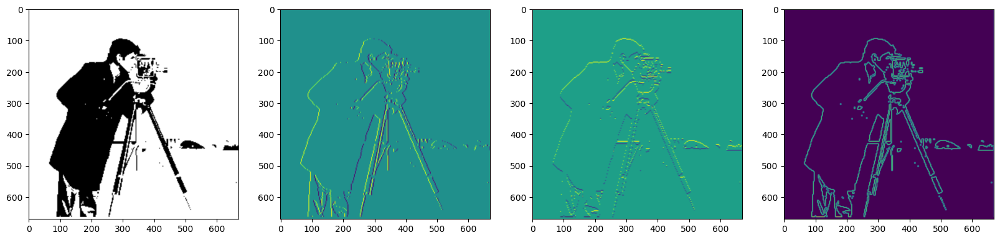

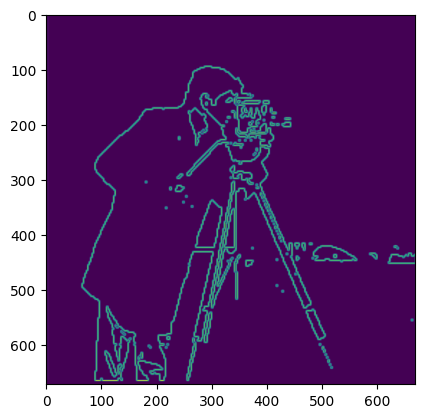

In [183]:


cameraman = cv2.imread("Images/cameraman.png")
cameraman_bounds = prewitt_filter(cameraman)
plt.imshow(cameraman_bounds)

# Partie 8 : Segmentation des images

La segmentation d’une image consiste à regrouper les pixels de l’image qui partagent les mêmes propriétés. Cette opération permet de classer les pixels d’une image en sous groupes selon des critères prédéfinis (classification). Lorsque l’on souhaite séparer les pixels d’une image en deux sous-groupes (deux classes), on parle de binarisation de l’image.

## 1. Segmentation d’images par seuillage d’histogramme (Binarisation)

Une technique simple de binarisation de l’image consiste à évaluer visuellement un seuil grâce l’observation de l’histogramme de l’image. En effet, l’histogramme nous permet d’évaluer la répartition des intensités des pixels de notre image. Lorsque les pixels de notre image sont regroupés en deux sous-groupes identifiables à l’œil nu, la binarisation est évidente, mais cette opération peut se compliquer avec une image réelle.

![image14](Images/Exemples/image14.png)

**Objectif :** étude d’une méthode simple d’évaluation de seuil pour la binarisation d’une image à partir du seuil choisi de manière aléatoire.

**Critère :** équi-répartition du nombre de pixels par classe.

**Algorithme :**
1. Choisir un seuil S de manière aléatoire (compris entre 0 et 255). Ainsi, les intensités inférieures à S appartiennent au groupe 1 et les intensités supérieures appartiennent au groupe 2.
2. Calculer la moyenne de chacun des deux groupes de pixels S1 et S2 grâce à la répartition des pixels donnée par l’histogramme de l’image.
3. Calculer 𝑆 = (S1 + S2) / 2 .
4. Répéter les étapes 2 et 3 jusqu’à ce que S soit constant.

**Travail proposé :**
1. Calculer l’histogramme de l’image « pepper.bmp » proposée.
2. Implémenter l’algorithme de seuillage proposé et vérifier la convergence de celui-ci.
3. Seuiller l’image de deux manières différentes :

![image15](Images/Exemples/image15.png)



In [184]:
def histogram(image):
    histogram = np.zeros(256)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            histogram[image[i, j]] += 1
    return histogram

def cumulated_histogram(histogram):
    cumulated_histogram = np.zeros(256)
    for i in range(256):
        if i != 0:
            cumulated_histogram[i] = cumulated_histogram[i - 1] + histogram[i]
        else:
            cumulated_histogram[i] = histogram[i]
    return cumulated_histogram

## 2. Segmentation d’images grâce à l’algorithme des K-means

**Contexte :**

La segmentation est une opération qui permet de classer les pixels d’une image en sous groupes. Une des méthodes de segmentation d’images est l’algorithme des K-means.

Étant donné un nombre de pixels n, on cherche à répartir ces n pixels en K classes 𝐶& , 𝐶% , … , 𝐶' en minimisant la distance entre les points internes à chaque classe. Ensuite, après convergence de l’algorithme, les pixels se situant dans le même sous-groupe vont prendre la valeur de la moyenne de ces points.


**Objectif : Ce projet propose de segmenter une image grâce à l’algorithme des k-means.**

**Algorithme :**
1. Choisir le nombre de classes (K classes par exemple).
2. Choisir de manière aléatoire les moyennes des K classes et les ranger dans un vecteur par ordre croissant.
3. Affecter pour chaque intensité i allant de 0 à 255 de l’histogramme, la classe ayant la moyenne la plus proche de cette intensité i :
    𝑐(𝑖) = min (|𝑖 − 𝑚k |)
            k∈[&,']
    𝑎𝑣𝑒𝑐 𝑚k 𝑙𝑎 𝑚𝑜𝑦𝑛𝑛𝑒 𝑑𝑒 𝑙𝑎 𝑘ème 𝑐𝑙𝑎𝑠𝑠𝑒
4. Calculer la moyenne de chaque nouvelle classe.
5. Répéter les étapes 3 et 4 jusqu’à convergence de l’algorithme.

**Travail proposé :**
1. Calculer l’histogramme de l’image « pepper.bmp » proposée.
2. Implémenter l’algorithme de k-means proposé et vérifier la convergence de celui-ci.
3. Segmenter l’image en affectant à chaque pixel, la moyenne de la classe auquel il appartient.
4. Tester l’image pour des nombres de classe différents.

**Résultats attendus :**
![image16](Images/Exemples/image16.png)

## 3. Question avancée

1. Segmentation par seuillage de l'histogramme et par Kmeans des images de poumon affecté et non affecté
    L'analyse de segmentation pas **Deep learning** et l'apport de l'intelligence artificielle

    ![image17](Images/Exemples/image17.png)

2. Classification par Kmeans des images couleur : modifier l'algorithme de Kmeans pour classer les nuages de points

    ![image18](Images/Exemples/image18.png)